In [ ]:


import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

main_folder = "/content/drive/MyDrive/MNIold2/train"  # Replace this with your actual folder path

# Define the path to the output folder where the 2D tensors will be saved
output_folder_train = "/content/drive/MyDrive/trained_dcnn_slices/dcnn_train"  # Replace this with your actual output folder path

def nifti_to_tensor(image_path):
    # Load the NIFTI image
    image = nib.load(image_path).get_fdata()

    # Get the number of slices in the z-axis
    num_slices = image.shape[2]

    # Select the 5th slice above the center slice
    center_slice = num_slices // 2

    # Extract the selected slice
    tensor = image[:, :, center_slice]

    # Normalize the tensor to the range [0, 1]
    tensor = (tensor - np.min(tensor)) / (np.max(tensor) - np.min(tensor))

    return tensor

# Iterate over each patient folder
for patient_folder in os.listdir(main_folder):
    # Get a list of all files in the current patient's folder
    files = os.listdir(os.path.join(main_folder, patient_folder))

    # Find the T1 MRI, Flair MRI, and PET scan based on their filenames
    for file in files:
        if "T1w" in file:
            t1_path = os.path.join(main_folder, patient_folder, file)
        elif "FLAIR" in file:
            flair_path = os.path.join(main_folder, patient_folder, file)
        elif "pet" in file:
            pet_path = os.path.join(main_folder, patient_folder, file)

    # Convert each image to a 2D tensor
    t1_tensor = nifti_to_tensor(t1_path)
    flair_tensor = nifti_to_tensor(flair_path)
    pet_tensor = nifti_to_tensor(pet_path)

    # Concatenate the T1 MRI and FLAIR MRI tensors along the channel dimension
    # Concatenate the T1 MRI and FLAIR MRI tensors along the channel dimension
    input_tensor = np.concatenate((t1_tensor[..., np.newaxis], flair_tensor[..., np.newaxis]), axis=2)


    # Convert the 2-channel image back to a grayscale image
    input_tensor = np.mean(input_tensor, axis=2)
    pet_tensor = np.mean(pet_tensor[..., np.newaxis], axis=2)  # Use axis 0 for height and width

   # Save the concatenated tensor and the PET tensor as images to the output folder
    plt.imsave(os.path.join(output_folder_train, f"{patient_folder}_input.png"), input_tensor, cmap='gray')
    plt.imsave(os.path.join(output_folder_train, f"{patient_folder}_target.png"), pet_tensor, cmap='gray')


print("All input and target images (5 slices from the center) have been successfully saved to the output folder.")


All input and target images (5 slices from the center) have been successfully saved to the output folder.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pet_tensor.shape


(207, 243)

In [ ]:
import tensorflow as tf
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

BUFFER_SIZE = 52
BATCH_SIZE = 1

# Get lists of T1, FLAIR, and PET scan file paths
input_files = sorted(tf.io.gfile.glob(os.path.join('/content/drive/MyDrive/trained_dcnn_slices/dcnn_train', '*_input.png')))
target_files = sorted(tf.io.gfile.glob(os.path.join('/content/drive/MyDrive/trained_dcnn_slices/dcnn_train', '*_target.png')))

# Make sure the lists of T1, FLAIR, and PET scan file paths have the same length
assert len(input_files) == len(target_files)

# Create a dataset of tuples, where each tuple is (T1 path, FLAIR path, PET path) for a single patient
file_paths_dataset_train = tf.data.Dataset.from_tensor_slices((input_files, target_files))

# Define a function to load and preprocess the images
def load_and_preprocess_images(input_path, target_path):
    # Load the images
    input_image = tf.io.read_file(input_path)
    target_image = tf.io.read_file(target_path)

    # Decode the images
    input_image = tf.image.decode_png(input_image, channels=1)
    target_image = tf.image.decode_png(target_image, channels=1)

    # Convert the images to float32 and normalize to [0, 1]
    input_image = tf.image.convert_image_dtype(input_image, tf.float32)
    target_image = tf.image.convert_image_dtype(target_image, tf.float32)

    return input_image, target_image

# Apply the function to the dataset
file_paths_dataset_train = file_paths_dataset_train.map(load_and_preprocess_images)

# Shuffle the dataset
file_paths_dataset_train = file_paths_dataset_train.shuffle(BUFFER_SIZE)

# Batch the dataset
file_paths_dataset_train = file_paths_dataset_train.batch(BATCH_SIZE)

# Prefetch the dataset
file_paths_dataset_train = file_paths_dataset_train.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)


The trained generator model was successfully loaded from 'trained_generator.h5' in your Google Drive


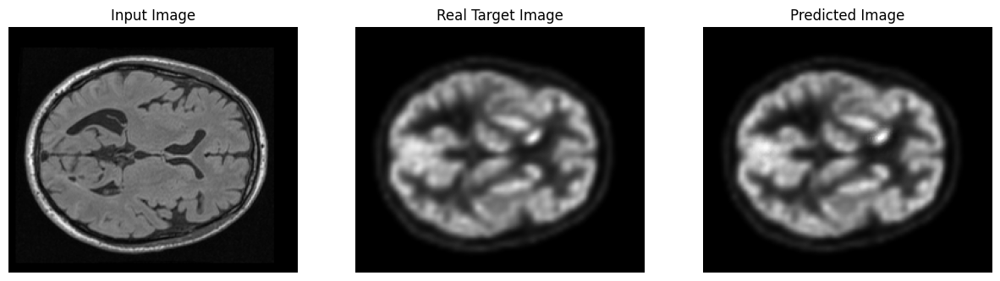

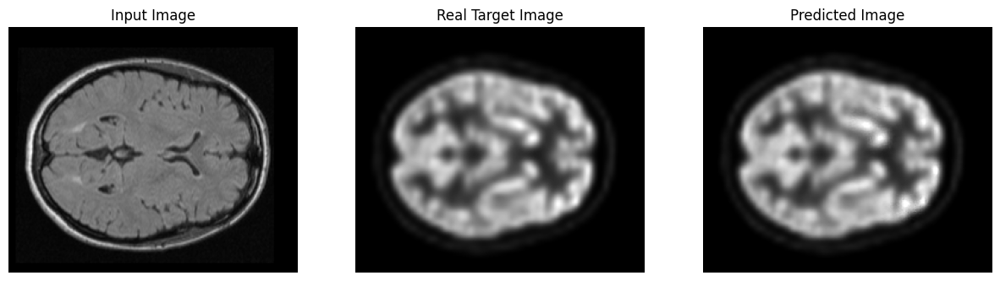

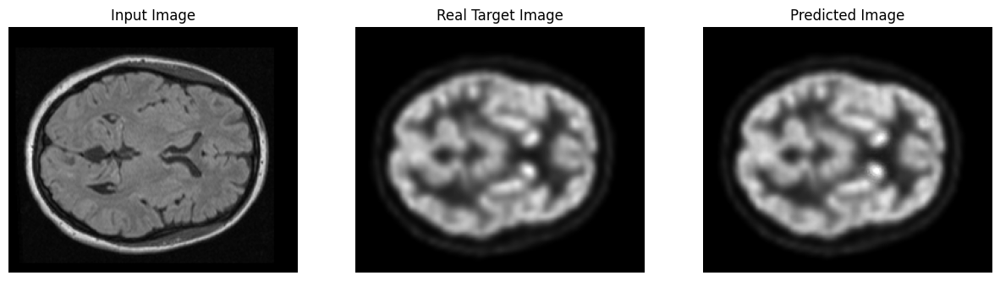

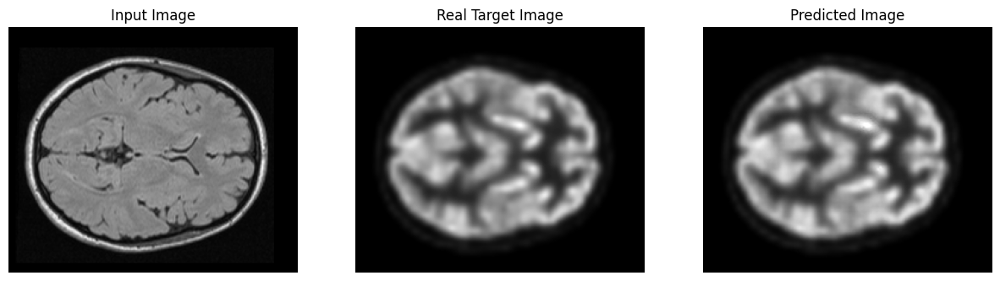

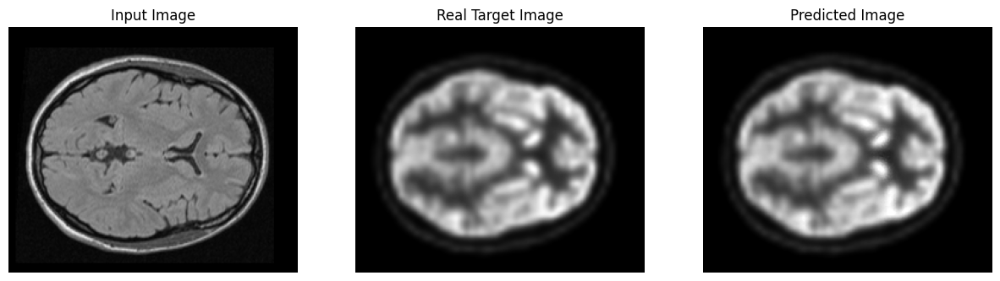

...

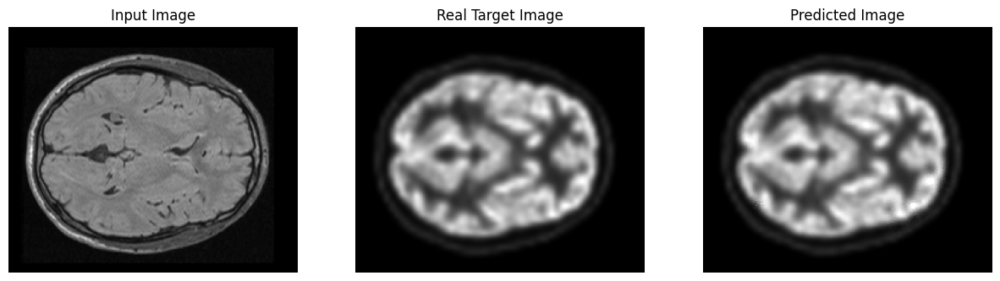

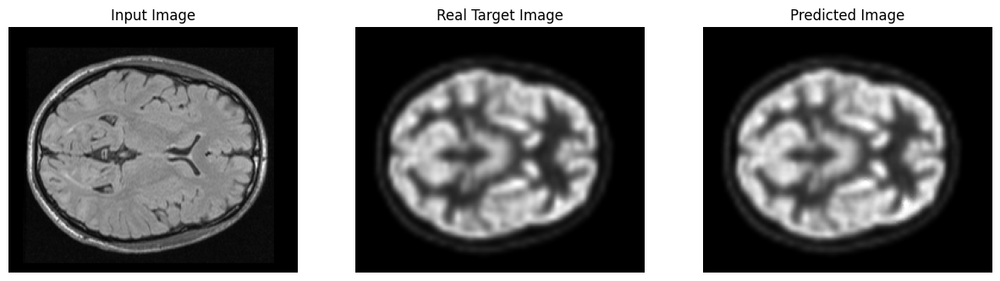

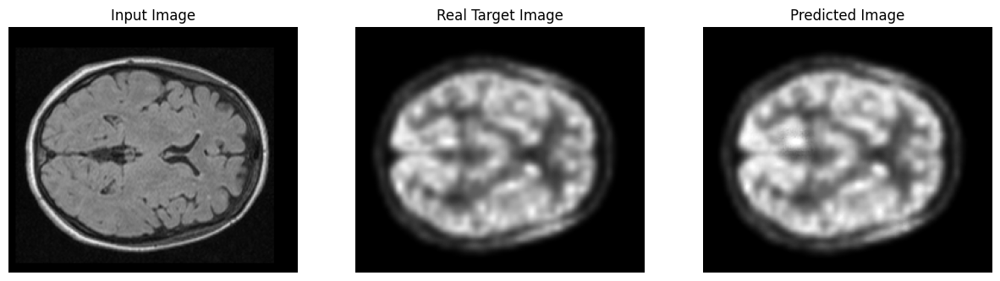

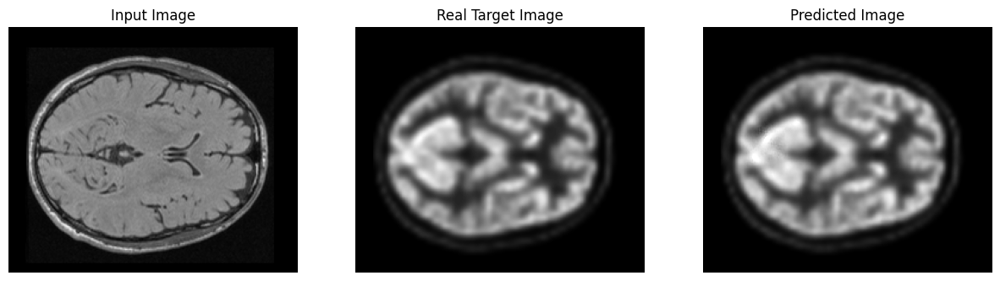

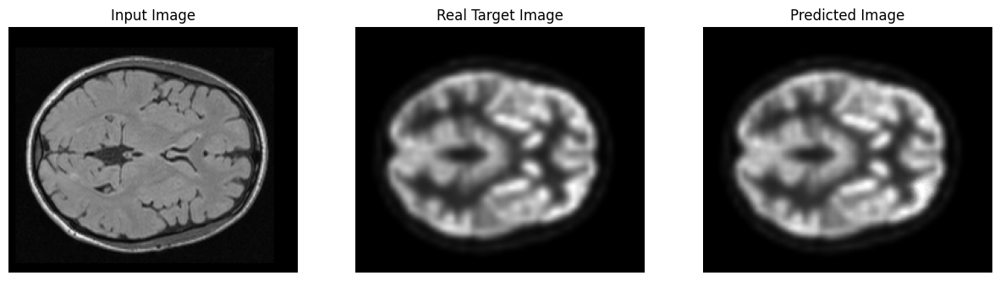

Average Mean Squared Error:  0.0003082398204172093
Average Mean Absolute Error:  0.006261476306602932
Average NRMSE:  0.011007271026476072
Average PSNR:  41.2263639156635
Average SSIM:  [0.9882024]


In [ ]:
# Import necessary libraries
from keras.models import load_model
import tensorflow as tf
import matplotlib.pyplot as plt

# Load the model from the file in Google Drive
trained_generator = load_model('/content/drive/MyDrive/saved_pix2pix_slices/trainedpix2pix.h5')

# Print a success message
print("The trained generator model was successfully loaded from 'trained_generator.h5' in your Google Drive")

# Initialize the error metrics
mse_total = 0
mae_total = 0
nrmse_total = 0
psnr_total = 0
ssim_total = 0
num_samples = 0

# Assuming that 'file_paths_dataset_test' is your test dataset
for input_image, target in file_paths_dataset_train:
    # Generate output image from the input image
    prediction = trained_generator(input_image, training=False)

    # Calculate the error metrics
    mse = tf.keras.losses.MeanSquaredError()
    mae = tf.keras.losses.MeanAbsoluteError()
    mse_total += mse(target, prediction).numpy()
    mae_total += mae(target, prediction).numpy()

    #Calculate NRMSE
    max_target = tf.reduce_max(target)
    min_target = tf.reduce_min(target)
    nrmse = tf.sqrt(mse(target, prediction)) / (max_target - min_target)
    nrmse_total += nrmse.numpy()

    # Calculate PSNR
    psnr = 20 * tf.math.log(max_target / tf.sqrt(mse(target, prediction))) / tf.math.log(10.0)
    psnr_total += psnr.numpy()

    #Calculate SSIM
    ssim = tf.image.ssim(target, prediction, max_val=max_target)
    ssim_total += ssim.numpy()

    num_samples += 1

    # Display the input image, real target image, and predicted image
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.title('Input Image')
    plt.imshow(input_image[0, :, :, 0], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Real Target Image')
    plt.imshow(target[0, :, :, 0], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Predicted Image')
    plt.imshow(prediction[0, :, :, 0], cmap='gray')
    plt.axis('off')

    plt.show()

# Calculate the average error metrics
mse_average = mse_total / num_samples
mae_average = mae_total / num_samples
nrmse_average = nrmse_total / num_samples
psnr_average = psnr_total / num_samples
ssim_average = ssim_total / num_samples

print("Average Mean Squared Error: ", mse_average)
print("Average Mean Absolute Error: ", mae_average)
print("Average NRMSE: ", nrmse_average)
print("Average PSNR: ", psnr_average)
print("Average SSIM: ", ssim_average)


In [ ]:
accuracy_mse = 100 * (1 - mse_average)  # Subtract from 1 to get accuracy
accuracy_mae = 100 * (1 - mae_average)

print("Accuracy (MSE): {:.2f}%".format(accuracy_mse))
print("Accuracy (MAE): {:.2f}%".format(accuracy_mae))

Accuracy (MSE): 99.97%
Accuracy (MAE): 99.37%


In [ ]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf

# Define the path to the new folder where the images will be stored
new_output_folder = "/content/drive/MyDrive/trained_dcnn_slices/results_p2p"

# Create the new folder if it doesn't exist
if not os.path.exists(new_output_folder):
    os.makedirs(new_output_folder)

# Iterate through the test dataset and save images for each patient
for idx, (input_image, target) in enumerate(file_paths_dataset_train):
    # Generate output image from the input image
    prediction = trained_generator(input_image, training=False)

    # Resize the prediction to (256, 256)
    prediction_resized = tf.image.resize(prediction, [256, 256])

    # Create a unique folder name for each patient (starting from 1)
    patient_folder = f"sub_{idx + 1}"  # Adjust indexing here

    # Save the resized image
    plt.imsave(os.path.join(new_output_folder, f"{patient_folder}_predicted.png"), prediction_resized[0, :, :, 0].numpy(), cmap='gray')

print(f"Saved images for {len(file_paths_dataset_train)} patients to {new_output_folder}")



Saved images for 26 patients to /content/drive/MyDrive/trained_dcnn_slices/results_p2p


In [ ]:
import os
import tensorflow as tf
import numpy as np
from PIL import Image

# Path to the folder containing your images
folder_path = "/content/drive/MyDrive/trained_dcnn_slices/results_p2p"

# Get all image filenames in the folder with PNG extension
image_filenames = [f for f in os.listdir(folder_path) if f.endswith('.png')]

# List to store the image tensors
image_tensors = []

# Read and convert each image into a tensor
for filename in image_filenames:
    # Construct the full path to the image
    image_path = os.path.join(folder_path, filename)

    # Open the image
    image = Image.open(image_path)

    # Convert the image to grayscale
    image = image.convert('L')

    # Convert the image to a TensorFlow tensor
    image_tensor = tf.convert_to_tensor(np.array(image), dtype=tf.float32)

    # Add the tensor to the list
    image_tensors.append(image_tensor)

print(f"Converted {len(image_tensors)} PET images to tensors.")

# Define the output folder
output_folder = "/content/drive/MyDrive/trained_dcnn_slices/input_tensorsUNETtraining" #input of dcnn in form of tensors saved to resultsofp2p

# Make sure the output folder exists
os.makedirs(output_folder, exist_ok=True)

# Iterate through the test dataset and save images for each patient
for idx, image_tensor in enumerate(image_tensors):

    # Create a unique folder name for each patient
    patient_folder = f"sub_{idx + 1}"  # Assuming patient names are sequential starting at sub_0027

    # Save the input image, the real target image, and the predicted image
    plt.imsave(os.path.join(output_folder, f"{patient_folder}_input_unet.png"), image_tensor, cmap='gray')

print(f"Saved images for {len(file_paths_dataset_train)} patients to {new_output_folder}")


Converted 26 PET images to tensors.
Saved images for 26 patients to /content/drive/MyDrive/trained_dcnn_slices/results_p2p


In [ ]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize  # Add this line to import the resize function

# Define the path to the main folder containing the patient folders
main_folder = "/content/drive/MyDrive/MNIold2/train"  # Replace this with your actual folder path

# Define the path to the output folder where the 2D tensors will be saved
output_folder_train = "/content/drive/MyDrive/trained_dcnn_slices/targets_tensorsofUNET"  # Replace this with your actual output folder path

# Define a function to convert a NIFTI image to a 2D tensor
def nifti_to_tensor(image_path):
    # Load the NIFTI image
    image = nib.load(image_path).get_fdata()

    # Calculate the center slice index
    center_slice_index = image.shape[2] // 2

    # Extract the 5th slice above the center slice
    target_slice_index = center_slice_index + 2

    # Extract the desired slice along the z-axis
    tensor = image[:, :, target_slice_index]

    # Normalize the tensor to the range [0, 1]
    tensor = (tensor - np.min(tensor)) / (np.max(tensor) - np.min(tensor))

    # Add an extra dimension to make it a 3D tensor
    tensor = np.expand_dims(tensor[..., np.newaxis], axis=2)

    return tensor

# Iterate over each patient folder
for patient_folder in os.listdir(main_folder):
    # Get a list of all files in the current patient's folder
    files = os.listdir(os.path.join(main_folder, patient_folder))

    # Initialize an empty list to store resized PET tensors
    resized_pet_tensors = []

    # Find the PET scan based on its filename
    for file in files:
        if "pet" in file:
            pet_path = os.path.join(main_folder, patient_folder, file)
            # Convert the PET image to a 2D tensor
            pet_tensor = nifti_to_tensor(pet_path)
            # Resize the tensor to (256, 256) using skimage.transform.resize
            resized_pet_tensor = resize(pet_tensor.squeeze(), (256, 256), mode='reflect', anti_aliasing=True)
            resized_pet_tensors.append(resized_pet_tensor)

    # Save all resized PET tensors as images to the output folder
    for i, resized_pet_tensor in enumerate(resized_pet_tensors):
        output_path = os.path.join(output_folder_train, f"{patient_folder}_resized_pet_{i}.png")
        plt.imsave(output_path, resized_pet_tensor.squeeze(), cmap='gray')

print("All resized PET tensors have been successfully saved to the output folder.")


All resized PET tensors have been successfully saved to the output folder.


In [ ]:
resized_pet_tensor.shape


(256, 256)

**TESTING DATA FOR dCNN**

In [ ]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

# Define the path to the main folder containing the patient folders
main_folder = "/content/drive/MyDrive/MNIold2/test"  # Replace this with your actual folder path

# Define the path to the output folder where the 2D tensors will be saved
output_folder_test = "/content/drive/MyDrive/trained_dcnn_slices/dcnn_test"  # Replace this with your actual output folder path

# Define a function to convert a NIFTI image to a 2D tensor
def nifti_to_tensor(image_path):
    # Load the NIFTI image
    image = nib.load(image_path).get_fdata()

    # Get the number of slices in the z-axis
    num_slices = image.shape[2]

    # Select the 5th slice above the center slice
    center_slice = num_slices // 2
    target_slice = center_slice

    # Extract the selected slice
    tensor = image[:, :, target_slice]

    # Normalize the tensor to the range [0, 1]
    tensor = (tensor - np.min(tensor)) / (np.max(tensor) - np.min(tensor))

    return tensor

# Iterate over each patient folder
for patient_folder in os.listdir(main_folder):
    # Get a list of all files in the current patient's folder
    files = os.listdir(os.path.join(main_folder, patient_folder))

    # Find the T1 MRI, Flair MRI, and PET scan based on their filenames
    for file in files:
        if "T1w" in file:
            t1_path = os.path.join(main_folder, patient_folder, file)
        elif "FLAIR" in file:
            flair_path = os.path.join(main_folder, patient_folder, file)
        elif "pet" in file:
            pet_path = os.path.join(main_folder, patient_folder, file)

    # Convert each image to a 2D tensor
    t1_tensor = nifti_to_tensor(t1_path)
    flair_tensor = nifti_to_tensor(flair_path)
    pet_tensor = nifti_to_tensor(pet_path)

    # Concatenate the T1 MRI and FLAIR MRI tensors along the channel dimension
    input_tensor = np.concatenate((t1_tensor[..., np.newaxis], flair_tensor[..., np.newaxis]), axis=2)

    # Convert the 2-channel image back to a grayscale image
    input_tensor = np.mean(input_tensor, axis=2)
    pet_tensor = np.mean(pet_tensor[..., np.newaxis], axis=2)

    # Save the concatenated tensor and the PET tensor as images to the output folder
    plt.imsave(os.path.join(output_folder_test, f"{patient_folder}_input.png"), input_tensor, cmap='gray')
    plt.imsave(os.path.join(output_folder_test, f"{patient_folder}_target.png"), pet_tensor, cmap='gray')

print("All input and target images have been successfully saved to the output folder.")


All input and target images have been successfully saved to the output folder.


In [ ]:
# Get lists of T1, FLAIR, and PET scan file paths for testing data
input_files_test = sorted(tf.io.gfile.glob(os.path.join('/content/drive/MyDrive/trained_dcnn_slices/dcnn_test', '*_input.png')))
target_files_test = sorted(tf.io.gfile.glob(os.path.join('/content/drive/MyDrive/trained_dcnn_slices/dcnn_test', '*_target.png')))

# Make sure the lists of T1, FLAIR, and PET scan file paths have the same length
assert len(input_files_test) == len(target_files_test)

# Create a dataset of tuples, where each tuple is (T1 path, FLAIR path, PET path) for a single patient
file_paths_dataset_test = tf.data.Dataset.from_tensor_slices((input_files_test, target_files_test))

# Apply the function to the dataset
file_paths_dataset_test = file_paths_dataset_test.map(load_and_preprocess_images)

# Batch the dataset
file_paths_dataset_test = file_paths_dataset_test.batch(BATCH_SIZE)

# Prefetch the dataset
file_paths_dataset_test = file_paths_dataset_test.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)


The trained generator model was successfully loaded from 'trained_generator.h5' in your Google Drive


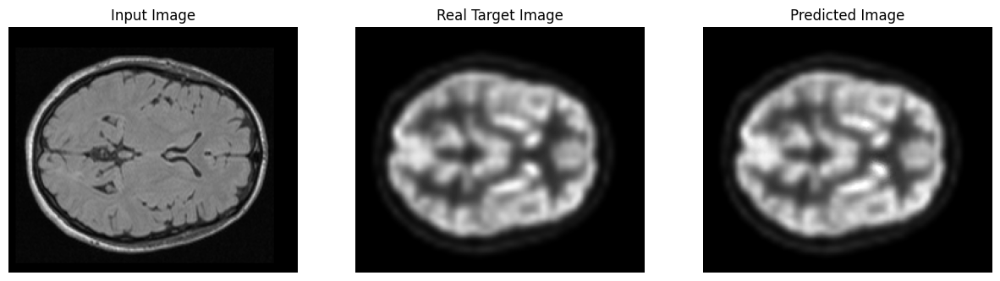

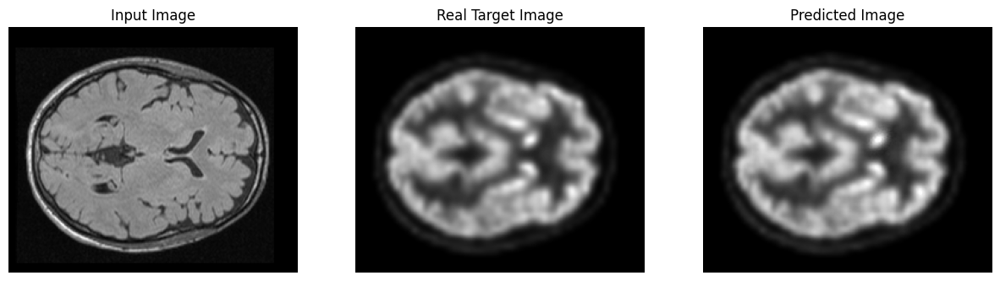

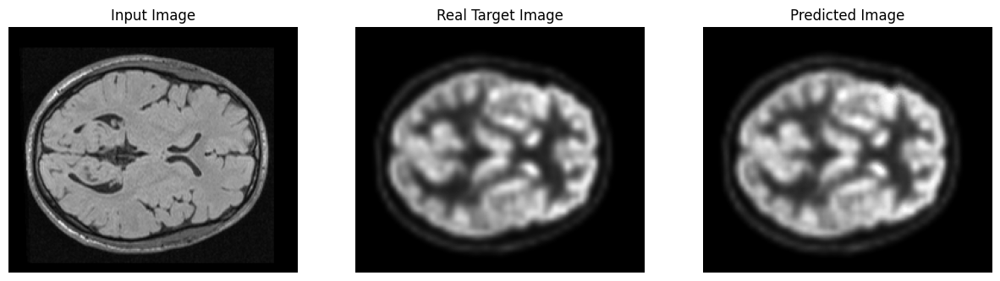

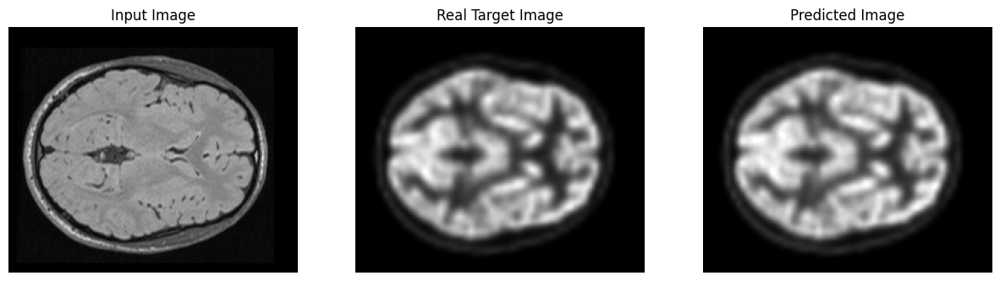

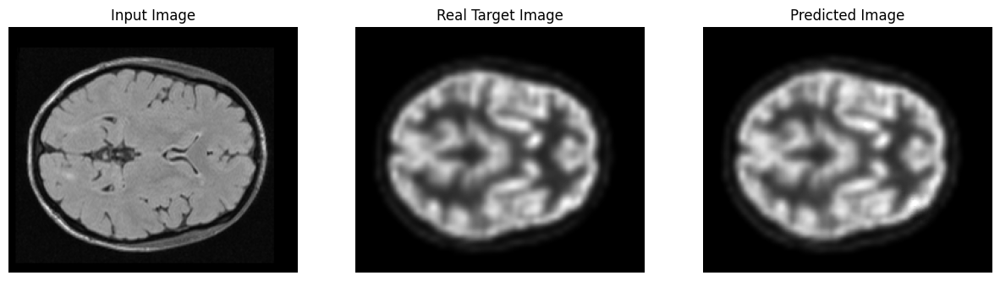

...

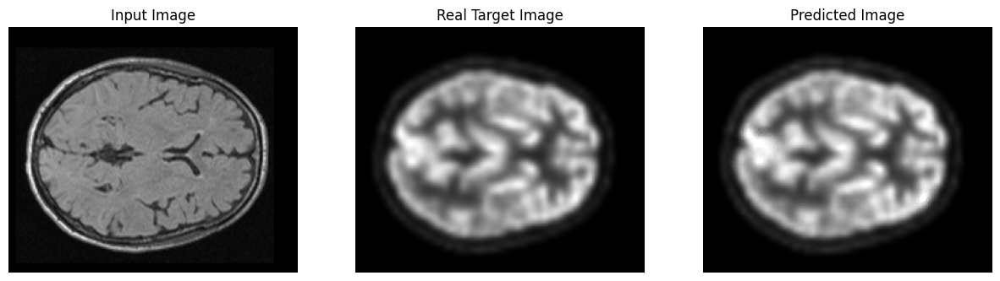

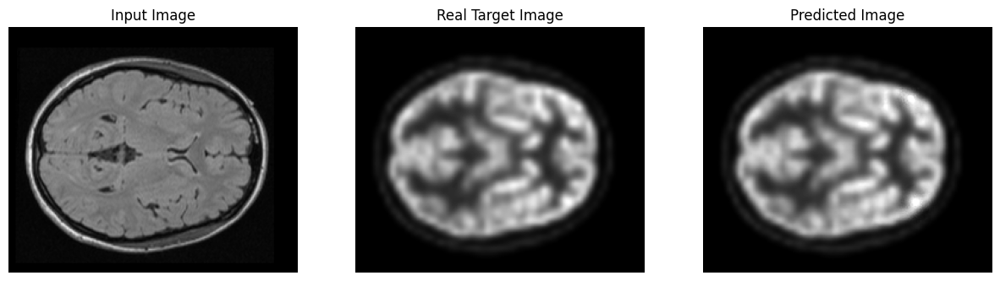

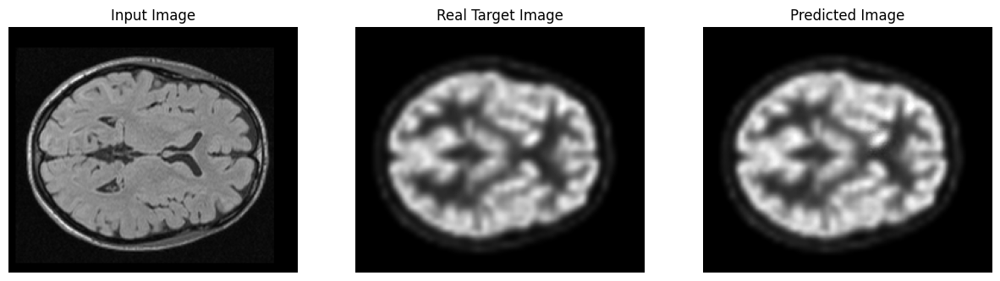

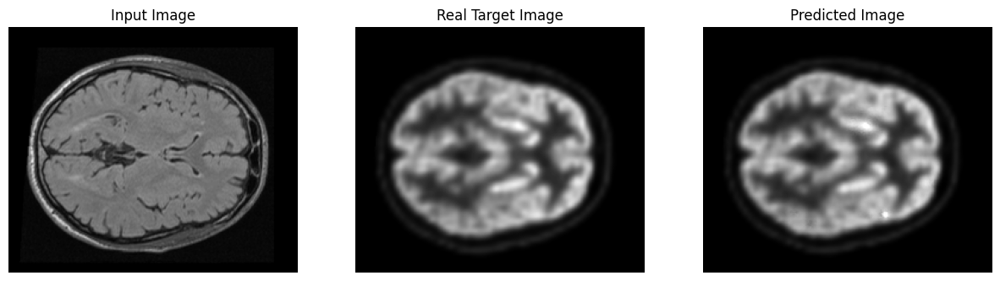

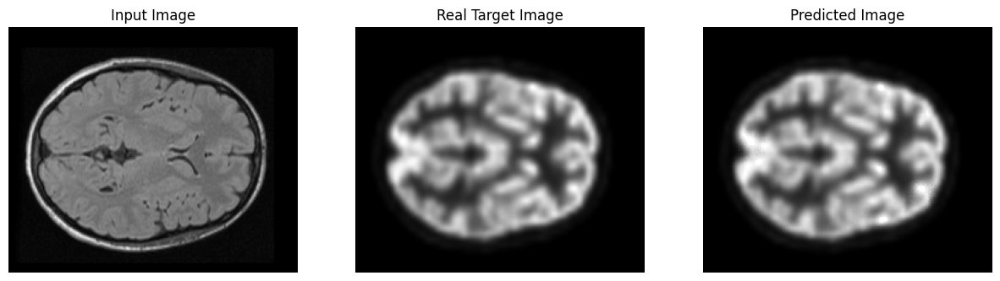

Average Mean Squared Error:  9.628071529732551e-05
Average Mean Absolute Error:  0.005624298810620199


In [ ]:
# Import necessary libraries
from keras.models import load_model
import tensorflow as tf
import matplotlib.pyplot as plt

# Load the model from the file in Google Drive
trained_generator = load_model('/content/drive/MyDrive/saved_pix2pix_slices/trainedpix2pix.h5')

# Print a success message
print("The trained generator model was successfully loaded from 'trained_generator.h5' in your Google Drive")

# Initialize the error metrics
mse_total = 0
mae_total = 0
num_samples = 0

# Assuming that 'file_paths_dataset_test' is your test dataset
for input_image, target in file_paths_dataset_test:
    # Generate output image from the input image
    prediction = trained_generator(input_image, training=False)

    # Calculate the error metrics
    mse = tf.keras.losses.MeanSquaredError()
    mae = tf.keras.losses.MeanAbsoluteError()
    mse_total += mse(target, prediction).numpy()
    mae_total += mae(target, prediction).numpy()
    num_samples += 1

     # Display the input image, the real target image, and the predicted image
    plt.figure(figsize=(15,5))

    plt.subplot(1, 3, 1)
    plt.title('Input Image')
    plt.imshow(input_image[0,:,:,0], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Real Target Image')
    plt.imshow(target[0,:,:,0], cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Predicted Image')
    plt.imshow(prediction[0,:,:,0], cmap='gray')
    plt.axis('off')

    plt.show()

# Calculate the average error metrics
mse_average = mse_total / num_samples
mae_average = mae_total / num_samples

print("Average Mean Squared Error: ", mse_average)
print("Average Mean Absolute Error: ", mae_average)

In [ ]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf

# Define the path to the new folder where the images will be stored
new_output_folder = "/content/drive/MyDrive/trained_dcnn_slices/results_p2p_testset"

# Create the new folder if it doesn't exist
if not os.path.exists(new_output_folder):
    os.makedirs(new_output_folder)

# Iterate through the test dataset and save images for each patient
for idx, (input_image, target) in enumerate(file_paths_dataset_test):
    # Generate output image from the input image
    prediction = trained_generator(input_image, training=False)

    # Resize the prediction to (256, 256)
    prediction_resized = tf.image.resize(prediction, [256, 256])

    # Create a unique folder name for each patient (starting from 1)
    patient_folder = f"sub_{idx + 27}"  # Adjust indexing here

    # Save the resized image
    plt.imsave(os.path.join(new_output_folder, f"{patient_folder}_predicted.png"), prediction_resized[0, :, :, 0].numpy(), cmap='gray')

print(f"Saved images for {len(file_paths_dataset_test)} patients to {new_output_folder}")



Saved images for 11 patients to /content/drive/MyDrive/trained_dcnn_slices/results_p2p_testset


In [ ]:
import os
import tensorflow as tf
import numpy as np
from PIL import Image

# Path to the folder containing your images
folder_path = "/content/drive/MyDrive/trained_dcnn_slices/results_p2p_testset"

# Get all image filenames in the folder with PNG extension
image_filenames = [f for f in os.listdir(folder_path) if f.endswith('.png')]

# List to store the image tensors
image_tensors = []

# Read and convert each image into a tensor
for filename in image_filenames:
    # Construct the full path to the image
    image_path = os.path.join(folder_path, filename)

    # Open the image
    image = Image.open(image_path)

    # Convert the image to grayscale
    image = image.convert('L')

    # Convert the image to a TensorFlow tensor
    image_tensor = tf.convert_to_tensor(np.array(image), dtype=tf.float32)

    # Add the tensor to the list
    image_tensors.append(image_tensor)

print(f"Converted {len(image_tensors)} PET images to tensors.")

# Define the output folder
output_folder = "/content/drive/MyDrive/trained_dcnn_slices/input_tensorsUNETtesting" #input of dcnn in form of tensors saved to resultsofp2p

# Make sure the output folder exists
os.makedirs(output_folder, exist_ok=True)

# Iterate through the test dataset and save images for each patient
for idx, image_tensor in enumerate(image_tensors):

    # Create a unique folder name for each patient
    patient_folder = f"sub_{idx + 27}"  # Assuming patient names are sequential starting at sub_0027

    # Save the input image, the real target image, and the predicted image
    plt.imsave(os.path.join(output_folder, f"{patient_folder}_input_unet.png"), image_tensor, cmap='gray')

print(f"Saved images for {len(file_paths_dataset_test)} patients to {new_output_folder}")


Converted 11 PET images to tensors.
Saved images for 11 patients to /content/drive/MyDrive/trained_dcnn_slices/results_p2p_testset


In [ ]:
import tensorflow as tf

BUFFER_SIZE = 52
BATCH_SIZE = 1

# Get lists of input and target image file paths
input_files = sorted(tf.io.gfile.glob(os.path.join('/content/drive/MyDrive/trained_dcnn_slices/input_tensorsUNETtraining', '*.png'))) #input
target_files = sorted(tf.io.gfile.glob(os.path.join('/content/drive/MyDrive/trained_dcnn_slices/targets_tensorsofUNET', '*.png')))

# Make sure the lists of input and target image file paths have the same length
assert len(input_files) == len(target_files)

# Create a dataset of tuples, where each tuple is (input path, target path) for a single patient
file_paths_dataset_train = tf.data.Dataset.from_tensor_slices((input_files, target_files))

# Define a function to load and preprocess the images
def load_and_preprocess_images(input_path, target_path):
    # Load the images
    input_image = tf.io.read_file(input_path)
    target_image = tf.io.read_file(target_path)

    # Decode the images
    input_image = tf.image.decode_png(input_image, channels=1)
    target_image = tf.image.decode_png(target_image, channels=1)

    # # Resize the images to dimensions divisible by 8
    # input_image = tf.image.resize(input_image, [256, 256])
    # target_image = tf.image.resize(target_image, [208, 240])

    # Convert the images to float32 and normalize to [0, 1]
    input_image = tf.image.convert_image_dtype(input_image, tf.float32)
    target_image = tf.image.convert_image_dtype(target_image, tf.float32)

    return input_image, target_image


# Get the first pair of input and target paths
input_path, target_path = next(iter(file_paths_dataset_train))

# Call the function load_and_preprocess_images with the first pair of paths
input_image, target_image = load_and_preprocess_images(input_path, target_path)

# Print the shape of input_image and target_image
print(f"The shape of input_image is {input_image.shape}")
print(f"The shape of target_image is {target_image.shape}")

# Apply the function to the dataset
file_paths_dataset_train = file_paths_dataset_train.map(load_and_preprocess_images)

# Shuffle the dataset
file_paths_dataset_train = file_paths_dataset_train.shuffle(BUFFER_SIZE)

# Batch the dataset
file_paths_dataset_train = file_paths_dataset_train.batch(BATCH_SIZE)

# Prefetch the dataset
file_paths_dataset_train = file_paths_dataset_train.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)



The shape of input_image is (256, 256, 1)
The shape of target_image is (256, 256, 1)


In [ ]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize  # Add this line to import the resize function

# Define the path to the main folder containing the patient folders
main_folder = "/content/drive/MyDrive/MNIold2/test"  # Replace this with your actual folder path

# Define the path to the output folder where the 2D tensors will be saved
output_folder_test = "/content/drive/MyDrive/trained_dcnn_slices/targets_tensorsofUNET_testing"  # Replace this with your actual output folder path

# Define a function to convert a NIFTI image to a 2D tensor
def nifti_to_tensor(image_path):
    # Load the NIFTI image
    image = nib.load(image_path).get_fdata()

    # Calculate the center slice index
    center_slice_index = image.shape[2] // 2

    # Extract the 5th slice above the center slice
    target_slice_index = center_slice_index

    # Extract the desired slice along the z-axis
    tensor = image[:, :, target_slice_index]

    # Normalize the tensor to the range [0, 1]
    tensor = (tensor - np.min(tensor)) / (np.max(tensor) - np.min(tensor))

    # Add an extra dimension to make it a 3D tensor
    tensor = np.expand_dims(tensor[..., np.newaxis], axis=2)

    return tensor

# Iterate over each patient folder
for patient_folder in os.listdir(main_folder):
    # Get a list of all files in the current patient's folder
    files = os.listdir(os.path.join(main_folder, patient_folder))

    # Initialize an empty list to store resized PET tensors
    resized_pet_tensors = []

    # Find the PET scan based on its filename
    for file in files:
        if "pet" in file:
            pet_path = os.path.join(main_folder, patient_folder, file)
            # Convert the PET image to a 2D tensor
            pet_tensor = nifti_to_tensor(pet_path)
            # Resize the tensor to (256, 256) using skimage.transform.resize
            resized_pet_tensor = resize(pet_tensor.squeeze(), (256, 256), mode='reflect', anti_aliasing=True)
            resized_pet_tensors.append(resized_pet_tensor)

    # Save all resized PET tensors as images to the output folder
    for i, resized_pet_tensor in enumerate(resized_pet_tensors):
        output_path = os.path.join(output_folder_test, f"{patient_folder}_resized_pet_{i}.png")
        plt.imsave(output_path, resized_pet_tensor.squeeze(), cmap='gray')

print("All resized PET tensors have been successfully saved to the output folder.")


All resized PET tensors have been successfully saved to the output folder.


In [ ]:
import tensorflow as tf

BUFFER_SIZE = 22
BATCH_SIZE = 1

# Get lists of input and target image file paths
input_files = sorted(tf.io.gfile.glob(os.path.join('/content/drive/MyDrive/trained_dcnn_slices/input_tensorsUNETtesting', '*.png'))) #input
target_files = sorted(tf.io.gfile.glob(os.path.join('/content/drive/MyDrive/trained_dcnn_slices/targets_tensorsofUNET_testing', '*.png')))

# Make sure the lists of input and target image file paths have the same length
assert len(input_files) == len(target_files)

# Create a dataset of tuples, where each tuple is (input path, target path) for a single patient
file_paths_dataset_test = tf.data.Dataset.from_tensor_slices((input_files, target_files))

# Define a function to load and preprocess the images
def load_and_preprocess_images(input_path, target_path):
    # Load the images
    input_image = tf.io.read_file(input_path)
    target_image = tf.io.read_file(target_path)

    # Decode the images
    input_image = tf.image.decode_png(input_image, channels=1)
    target_image = tf.image.decode_png(target_image, channels=1)

    # # Resize the images to dimensions divisible by 8
    # input_image = tf.image.resize(input_image, [256, 256])
    # target_image = tf.image.resize(target_image, [208, 240])

    # Convert the images to float32 and normalize to [0, 1]
    input_image = tf.image.convert_image_dtype(input_image, tf.float32)
    target_image = tf.image.convert_image_dtype(target_image, tf.float32)

    return input_image, target_image


# Get the first pair of input and target paths
input_path, target_path = next(iter(file_paths_dataset_test))

# Call the function load_and_preprocess_images with the first pair of paths
input_image, target_image = load_and_preprocess_images(input_path, target_path)

# Print the shape of input_image and target_image
print(f"The shape of input_image is {input_image.shape}")
print(f"The shape of target_image is {target_image.shape}")

# Apply the function to the dataset
file_paths_dataset_test = file_paths_dataset_test.map(load_and_preprocess_images)

# Shuffle the dataset
file_paths_dataset_test = file_paths_dataset_test.shuffle(BUFFER_SIZE)

# Batch the dataset
file_paths_dataset_test = file_paths_dataset_test.batch(BATCH_SIZE)

# Prefetch the dataset
file_paths_dataset_test = file_paths_dataset_test.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)



The shape of input_image is (256, 256, 1)
The shape of target_image is (256, 256, 1)


**dCNN**

In [ ]:
# import tensorflow as tf
# from tensorflow.keras.layers import Conv2D, Activation, MaxPooling2D, BatchNormalization, UpSampling2D

# def srcnn_model_v2(input_shape):
#     inputs = tf.keras.Input(shape=input_shape)

#     # Feature extraction
#     x = Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(inputs)
#     x = Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(x)
#     x = MaxPooling2D(pool_size=(2, 2))(x)

#     # Intermediate processing
#     x = Conv2D(filters=128, kernel_size=3, padding='same', activation='relu')(x)
#     x = Conv2D(filters=128, kernel_size=3, padding='same', activation='relu')(x)
#     x = MaxPooling2D(pool_size=(2, 2))(x)

#     # Upsampling and reconstruction
#     x = UpSampling2D(size=(2, 2))(x)
#     x = Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(x)
#     x = Conv2D(filters=64, kernel_size=3, padding='same', activation='relu')(x)

#     # Sub-Pixel Convolution Layer
#     x = Conv2D(filters=64, kernel_size=3, padding='same')(x)
#     x = Activation('relu')(x)
#     x = Conv2D(filters=64, kernel_size=3, padding='same')(x)
#     x = tf.nn.depth_to_space(x, 2)  # Rearrange feature maps

#     # Mini-Network
#     x = Conv2D(filters=32, kernel_size=3, padding='same')(x)
#     x = BatchNormalization()(x)
#     x = Activation('relu')(x)
#     x = Conv2D(filters=32, kernel_size=3, padding='same')(x)
#     x = BatchNormalization()(x)
#     x = Activation('relu')(x)

#     final_output = Conv2D(filters=1, kernel_size=3, padding='same', activation='relu')(x)

#     model = tf.keras.Model(inputs, final_output)
#     return model

# # Create the model
# input_shape = (256, 256, 1)  # Adjust based on your image size and channels
# model = srcnn_model_v2(input_shape)

# # Compile the model with Adam optimizer
# model.compile(optimizer='adam', loss='euclidean_loss')

# # Display model summary
# model.summary()


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Activation, UpSampling2D, MaxPooling2D, BatchNormalization, PReLU

def subpixel_conv_layer(x, scale=2):
    # Sub-Pixel Convolution Layer (ESPCN-inspired)
    x = Conv2D(filters=128, kernel_size=3, padding='same')(x)  # Increase filters to capture more details
    x = PReLU()(x)  # Use PReLU activation
    x = Conv2D(filters=128, kernel_size=3, padding='same')(x)  # Increase filters to capture more details
    x = tf.nn.depth_to_space(x, scale)  # Rearrange feature maps
    return x

def mini_network(x):
    # Mini-Network
    x = Conv2D(filters=64, kernel_size=3, padding='same')(x)  # Increase filters to capture more details
    x = BatchNormalization()(x)
    x = PReLU()(x)  # Use PReLU activation
    x = Conv2D(filters=64, kernel_size=3, padding='same')(x)  # Increase filters to capture more details
    x = BatchNormalization()(x)
    x = PReLU()(x)  # Use PReLU activation
    return x

def srcnn_model(input_shape):
    inputs = tf.keras.Input(shape=input_shape)
    hidden_layers = mini_network(inputs)
    sr_output = Conv2D(filters=32, kernel_size=3, padding='same')(hidden_layers)
    sr_output = BatchNormalization()(sr_output)
    sr_output = PReLU()(sr_output)  # Use PReLU activation
    sr_output = Conv2D(filters=16, kernel_size=3, padding='same')(sr_output)
    sr_output = BatchNormalization()(sr_output)
    sr_output = PReLU()(sr_output)  # Use PReLU activation
    downsampling_layer = MaxPooling2D(pool_size=(2, 2))(sr_output)
    upsampling_layer = subpixel_conv_layer(downsampling_layer)  # Apply subpixel convolution to increase resolution
    final_output = Conv2D(filters=1, kernel_size=3, padding='same')(upsampling_layer)  # Remove activation here
    final_output = PReLU()(final_output)  # Use PReLU activation
    model = tf.keras.Model(inputs, final_output)
    return model

# Example usage for grayscale images:
input_shape = (256, 256, 1)  # Adjust based on your image size and channels
model = srcnn_model(input_shape)
model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      640       
                                                                 
 batch_normalization (Batch  (None, 256, 256, 64)      256       
 Normalization)                                                  
                                                                 
 p_re_lu (PReLU)             (None, 256, 256, 64)      4194304   
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 64)      36928     
                                                                 
 batch_normalization_1 (Bat  (None, 256, 256, 64)      256       
 chNormalization)                                            

In [ ]:
# import tensorflow as tf
# from tensorflow.keras.layers import Conv2D, Activation, UpSampling2D, MaxPooling2D, BatchNormalization

# def subpixel_conv_layer(x, scale=2):
#     # Sub-Pixel Convolution Layer (ESPCN-inspired)
#     x = Conv2D(filters=64, kernel_size=3, padding='same')(x)
#     x = Activation('relu')(x)
#     x = Conv2D(filters=64, kernel_size=3, padding='same')(x)
#     x = tf.nn.depth_to_space(x, scale)  # Rearrange feature maps
#     return x

# def mini_network(x):
#     # Mini-Network
#     x = Conv2D(filters=32, kernel_size=3, padding='same')(x)
#     x = BatchNormalization()(x)
#     x = Activation('relu')(x)
#     x = Conv2D(filters=32, kernel_size=3, padding='same')(x)
#     x = BatchNormalization()(x)
#     x = Activation('relu')(x)
#     return x

# def srcnn_model(input_shape):
#     inputs = tf.keras.Input(shape=input_shape)
#     hidden_layers = mini_network(inputs)
#     sr_output = Conv2D(filters=32, kernel_size=3, padding='same')(hidden_layers)
#     sr_output = BatchNormalization()(sr_output)
#     sr_output = Activation('relu')(sr_output)
#     sr_output = Conv2D(filters=16, kernel_size=3, padding='same')(sr_output)
#     sr_output = BatchNormalization()(sr_output)
#     sr_output = Activation('relu')(sr_output)
#     downsampling_layer = MaxPooling2D(pool_size=(2, 2))(sr_output)
#     upsampling_layer = subpixel_conv_layer(downsampling_layer)  # Apply subpixel convolution to increase resolution
#     final_output = Conv2D(filters=1, kernel_size=3, padding='same', activation='relu')(upsampling_layer)  # Convert to single channel
#     model = tf.keras.Model(inputs, final_output)
#     return model

# # Example usage for grayscale images:
# input_shape = (256, 256, 1)  # Adjust based on your image size and channels
# model = srcnn_model(input_shape)
# model.summary()


In [ ]:
# import tensorflow as tf
# from tensorflow.keras.layers import Conv2D, Activation, UpSampling2D, MaxPooling2D

# def subpixel_conv_layer(x, scale=2):
#     # Sub-Pixel Convolution Layer (ESPCN-inspired)
#     x = Conv2D(filters=64, kernel_size=3, padding='same')(x)
#     x = Activation('relu')(x)
#     x = Conv2D(filters=64, kernel_size=3, padding='same')(x)
#     x = tf.nn.depth_to_space(x, scale)  # Rearrange feature maps
#     return x

# def mini_network(x):
#     # Mini-Network
#     x = Conv2D(filters=32, kernel_size=3, padding='same')(x)
#     x = Activation('relu')(x)
#     x = Conv2D(filters=32, kernel_size=3, padding='same')(x)  # Add an extra layer
#     x = Activation('relu')(x)
#     return x

# def srcnn_model(input_shape):
#     inputs = tf.keras.Input(shape=input_shape)
#     hidden_layers = mini_network(inputs)
#     sr_output = Conv2D(filters=16, kernel_size=3, padding='same', activation='relu')(hidden_layers)
#     downsampling_layer = MaxPooling2D(pool_size=(2, 2))(sr_output)
#     upsampling_layer = subpixel_conv_layer(downsampling_layer)  # Apply subpixel convolution to increase resolution
#     final_output = Conv2D(filters=1, kernel_size=3, padding='same', activation='relu')(upsampling_layer)  # Convert to single channel
#     model = tf.keras.Model(inputs, final_output)
#     return model

# # Example usage for grayscale images:
# input_shape = (256, 256, 1)  # Adjust based on your image size and channels
# model = srcnn_model(input_shape)
# model.summary()


In [ ]:
# from tensorflow.keras.utils import plot_model

# # Get the model
# model = get_model()

# # Plot the model
# plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)


In [ ]:
# import tensorflow as tf

# def pixel_mse_loss(y_true, y_pred):
#     return tf.reduce_mean(tf.square(y_true - y_pred))

# # Example usage:
# # Assuming y_true and y_pred are tensors representing ground truth and predicted images
# loss_value = pixel_mse_loss(y_true, y_pred)


In [ ]:
# LAMBDA = 100
# def custom_loss(y_true, y_pred):
#     # Ensure shapes match
#     assert y_true.shape == y_pred.shape, "Shapes of y_true and y_pred must match"

#     mse = tf.reduce_mean(tf.square(y_true - y_pred))
#     mae = tf.reduce_mean(tf.abs(y_true - y_pred))
#     return mse + LAMBDA * mae


In [ ]:


# def euclidean_loss(y_true, y_pred):
#     return tf.reduce_mean(tf.square(y_true - y_pred))

# optimizer = tf.keras.optimizers.Adam(learning_rate=10e-4)
# # Compile the model with Adam optimizer
# model.compile(optimizer='adam', loss='euclidean_loss')

import tensorflow as tf
from tensorflow.keras import backend as K

def perceptual_loss(y_true, y_pred):
    # Extract features from earlier layers of the model for both true and predicted images
    features_true = y_true  # Extract features from earlier layers of y_true
    features_pred = y_pred  # Extract features from earlier layers of y_pred

    # Compute the perceptual loss based on feature differences
    loss = K.mean(K.square(features_true - features_pred))

    return loss

# Example usage:
# Assuming y_true and y_pred are the ground truth and generated images respectively
# and they have shape (batch_size, height, width, channels)
# You can use this loss function in model.compile() as follows:

model.compile(optimizer='adam', loss=[perceptual_loss])




In [ ]:
target_image.shape

TensorShape([256, 256, 1])

In [ ]:
input_image.shape

TensorShape([256, 256, 1])

In [ ]:
# import matplotlib.pyplot as plt
# from IPython.display import clear_output
# import numpy as np
# import cv2  # Import OpenCV for image processing

# def train_srcnn_model(model, train_dataset, validation_dataset, epochs=2000, learning_rate=1e-4, clear_output_freq=20):
#     """
#     Trains the SRCNN model.

#     Args:
#         model: The compiled SRCNN model.
#         train_dataset: TensorFlow Dataset for training images (input and target).
#         validation_dataset: TensorFlow Dataset for validation images (input and target).
#         epochs: Number of training epochs (default: 2000).
#         learning_rate: Learning rate for the optimizer (default: 1e-4).
#         clear_output_freq: Frequency to clear output and display images (default: 20).
#     """
#     optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)  # Use Adam optimizer
#     model.compile(optimizer=optimizer, loss=[perceptual_loss])  # Use custom loss function

#     # def post_process(image):
#     #     # Convert image to uint8 if not already in that format
#     #     if image.dtype != np.uint8:
#     #         image = np.clip(image, 0, 255).astype(np.uint8)
#     #     # Convert to grayscale if not already
#     #     if len(image.shape) == 3:
#     #         image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#     #     # Apply histogram equalization
#     #     image_equalized = cv2.equalizeHist(image)
#     #     # Apply unsharp masking
#     #     blurred = cv2.GaussianBlur(image_equalized, (5, 5), 10.0)
#     #     sharp = cv2.addWeighted(image_equalized, 1.5, blurred, -0.5, 0)
#     #     return sharp

#     # def post_process(image):
#     #     # Convert image to uint8 if not already in that format
#     #     if image.dtype != np.uint8:
#     #         image = np.clip(image, 0, 255).astype(np.uint8)

#     #     # Apply unsharp masking
#     #     blurred = cv2.GaussianBlur(image, (5, 5), 10.0)
#     #     sharp = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)

#     #     return sharp



#     def display_images(input_image, target_image, prediction):
#         plt.figure(figsize=(15, 5))
#         plt.subplot(1, 3, 1)
#         plt.imshow(input_image, cmap='gray')
#         plt.title('Input Image')
#         plt.subplot(1, 3, 2)
#         plt.imshow(target_image, cmap='gray')
#         plt.title('Target Image')
#         plt.subplot(1, 3, 3)
#         plt.imshow(prediction, cmap='gray')
#         plt.title('Predicted Image')
#         plt.show()

#     for epoch in range(epochs):
#         print(f"Epoch {epoch+1}/{epochs}")

#         for input_image, target_image in train_dataset:
#             loss = model.train_on_batch(input_image, target_image)

#         if (epoch + 1) % clear_output_freq == 0:
#             clear_output(wait=True)
#             for input_image, target_image in validation_dataset.take(1):
#                 prediction = model.predict(input_image)
#                 # prediction_post_processed = post_process(prediction[0])
#                 display_images(input_image[0], target_image[0], prediction)

#     return model

# # Train the SRCNN model with SGD optimizer
# trained_model = train_srcnn_model(model, file_paths_dataset_train, file_paths_dataset_test, epochs=2000, learning_rate=1e-4, clear_output_freq=20)


1/1 [==============================] - 0s 18ms/step


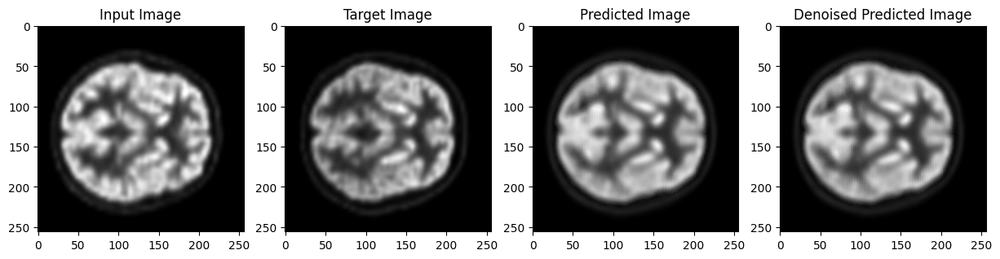

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import clear_output

def train_srcnn_model(model, train_dataset, validation_dataset, epochs=100, learning_rate=10e-4, clear_output_freq=20):
    """
    Trains the SRCNN model.

    Args:
        model: The compiled SRCNN model.
        train_dataset: TensorFlow Dataset for training images (input and target).
        validation_dataset: TensorFlow Dataset for validation images (input and target).
        epochs: Number of training epochs (default: 100).
        learning_rate: Learning rate for the optimizer (default: 1e-4).
        clear_output_freq: Frequency to clear output and display images (default: 20).
    """
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)  # Use Adam optimizer
    model.compile(optimizer=optimizer, loss=[perceptual_loss])  # Use custom loss function

    # Define a function to display images
    def display_images(input_image, target_image, prediction):
        input_image = np.squeeze(input_image)
        target_image = np.squeeze(target_image)
        prediction = np.squeeze(prediction)

        # Increase contrast of the predicted image
        increased_contrast_prediction = increase_contrast(prediction)
        # Remove noise from the increased contrast image
        # denoised_prediction = remove_noise(increased_contrast_prediction)

        plt.figure(figsize=(15, 5))
        plt.subplot(1, 4, 1)
        plt.imshow(input_image, cmap='gray')
        plt.title('Input Image')
        plt.subplot(1, 4, 2)
        plt.imshow(target_image, cmap='gray')
        plt.title('Target Image')
        plt.subplot(1, 4, 3)
        plt.imshow(prediction, cmap='gray')
        plt.title('Predicted Image')
        plt.subplot(1, 4, 4)
        plt.imshow(increased_contrast_prediction, cmap='gray')
        plt.title('Denoised Predicted Image')
        plt.show()

    # Training loop
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")

        # Training step
        for input_image, target_image in train_dataset:
            loss = model.train_on_batch(input_image, target_image)

        # Display generated images and clear output
        if (epoch + 1) % clear_output_freq == 0:
            clear_output(wait=True)
            for input_image, target_image in validation_dataset.take(1):
                prediction = model.predict(input_image)
                display_images(input_image[0], target_image[0], prediction[0])

def increase_contrast(image, alpha=1.0, clip=True):
    # Convert the image to float32 format
    image = image.astype(np.float32)

    # Compute the minimum and maximum pixel values
    min_val = np.min(image)
    max_val = np.max(image)

    # Normalize the image to the range [0, 1]
    image_normalized = (image - min_val) / (max_val - min_val)

    # Apply contrast adjustment
    increased_contrast_image = (image_normalized ** alpha) * (max_val - min_val) + min_val

    # Clip pixel values if specified
    if clip:
        increased_contrast_image = np.clip(increased_contrast_image, 0, 1)

    return increased_contrast_image.astype(np.float32)


def remove_noise(image, kernel_size=3):
    # Apply Gaussian blur to remove noise
    denoised_image = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
    return denoised_image

# Train the SRCNN model with Adam optimizer
train_srcnn_model(model, file_paths_dataset_train, file_paths_dataset_test, epochs=80, learning_rate=10e-4, clear_output_freq=20)


In [ ]:
# import matplotlib.pyplot as plt
# from IPython.display import clear_output
# import numpy as np

# # Define a function to generate images and display them
# def generate_images(model, input_image, target_image):
#     # Generate a prediction for the input image
#     prediction = model.predict(input_image[None, ...])[0]

#     # Display the input image, target image, and prediction
#     plt.figure(figsize=(15, 5))
#     plt.subplot(1, 3, 1)
#     plt.imshow(input_image, cmap='gray')
#     plt.title('Input Image')
#     plt.subplot(1, 3, 2)
#     plt.imshow(target_image, cmap='gray')
#     plt.title('Target Image')
#     plt.subplot(1, 3, 3)
#     plt.imshow(prediction, cmap='gray')
#     plt.title('Predicted Image')
#     plt.show()

from IPython.display import clear_output

# Define a custom callback to clear the display and generate images every 10 epochs
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch % 10 == 0:
            # Clear the display
            clear_output(wait=True)

            # Generate and display images
            for input_image, target_image in file_paths_dataset_train.take(1):
                generate_images(self.model, input_image[0], target_image[0])

# # Instantiate the model
# model = get_model()

# # Compile the model
# model.compile(optimizer=optimizer, loss=custom_loss)

# # Train the model
# model.fit(file_paths_dataset_train, epochs=2000, callbacks=[DisplayCallback()])



In [ ]:
# Save the trained model to a file
model.save('/content/drive/MyDrive/trained_dcnn_slices/new_model.h5')

# Print a success message
print("Model saved as 'trained_UNETslice.h5' in your Google Drive")


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved as 'trained_UNETslice.h5' in your Google Drive


In [ ]:
import tensorflow as tf
from tensorflow.keras import backend as K

def perceptual_loss(y_true, y_pred):
    # Extract features from earlier layers of the model for both true and predicted images
    features_true = y_true  # Extract features from earlier layers of y_true
    features_pred = y_pred  # Extract features from earlier layers of y_pred

    # Compute the perceptual loss based on feature differences
    loss = K.mean(K.square(features_true - features_pred))

# Load your trained U-Net-like model
model_path = '/content/drive/MyDrive/trained_dcnn_slices/new_model.h5'
trained_model = tf.keras.models.load_model(model_path, custom_objects={'perceptual_loss': perceptual_loss})

1/1 [==============================] - 0s 18ms/step


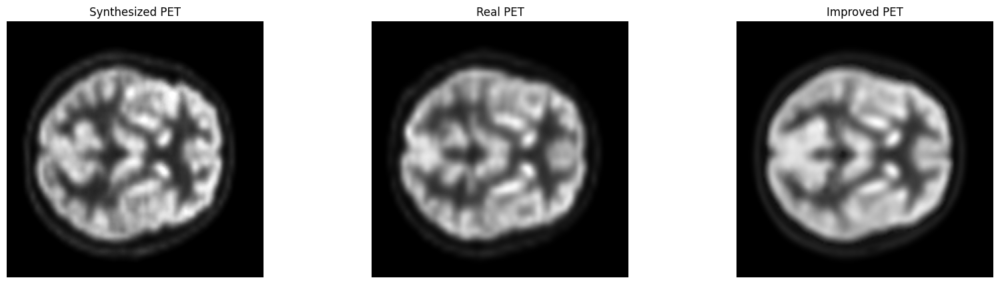

1/1 [==============================] - 0s 18ms/step


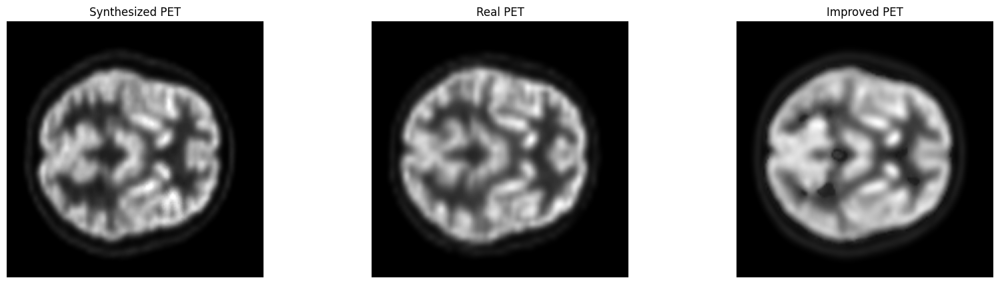

1/1 [==============================] - 0s 18ms/step


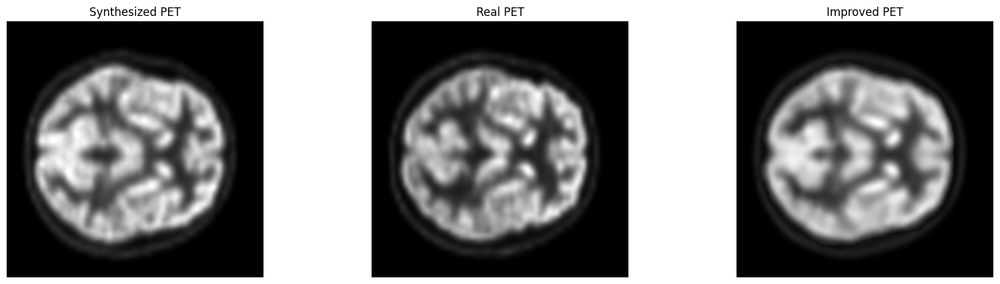

1/1 [==============================] - 0s 17ms/step


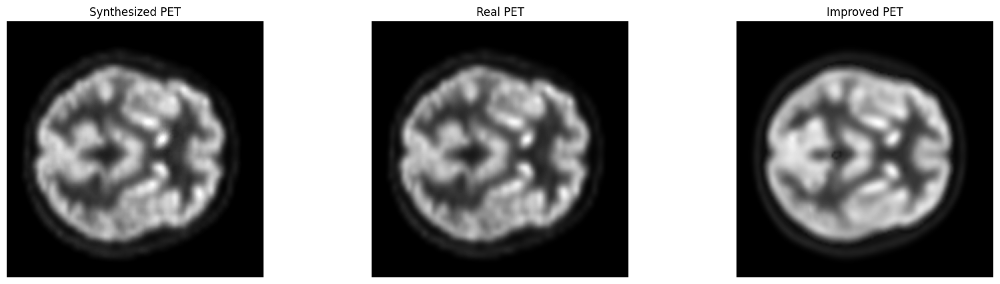

1/1 [==============================] - 0s 18ms/step


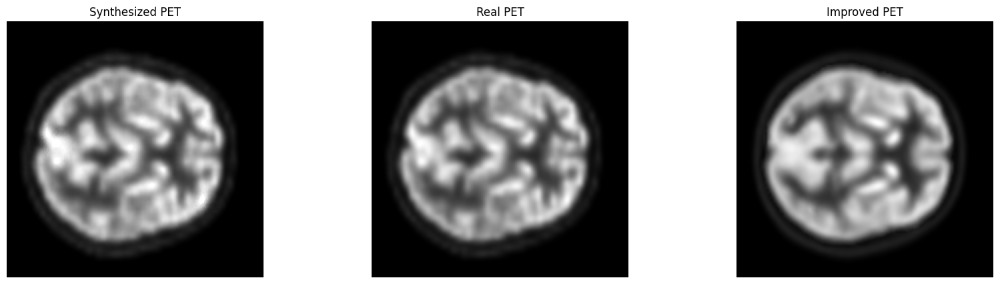

1/1 [==============================] - 0s 17ms/step


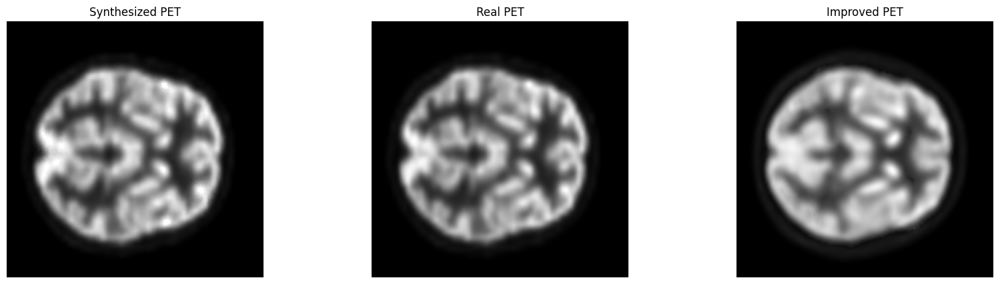

1/1 [==============================] - 0s 18ms/step


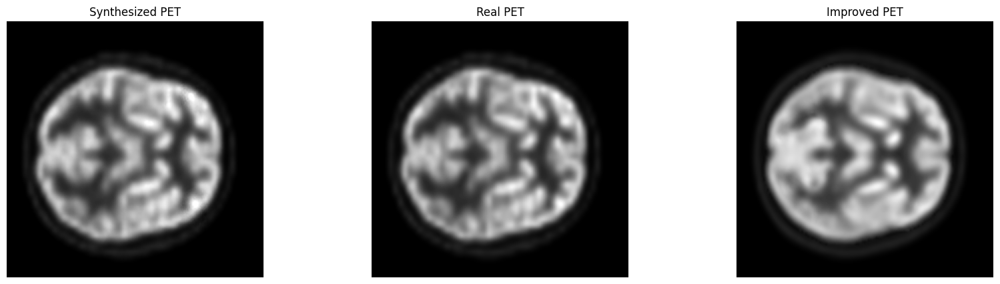

1/1 [==============================] - 0s 17ms/step


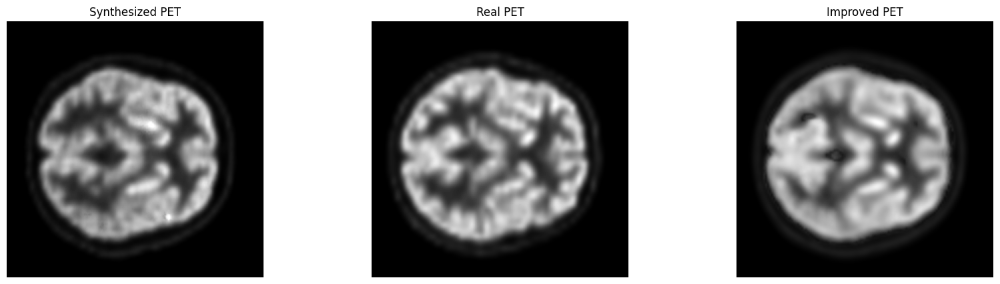

1/1 [==============================] - 0s 18ms/step


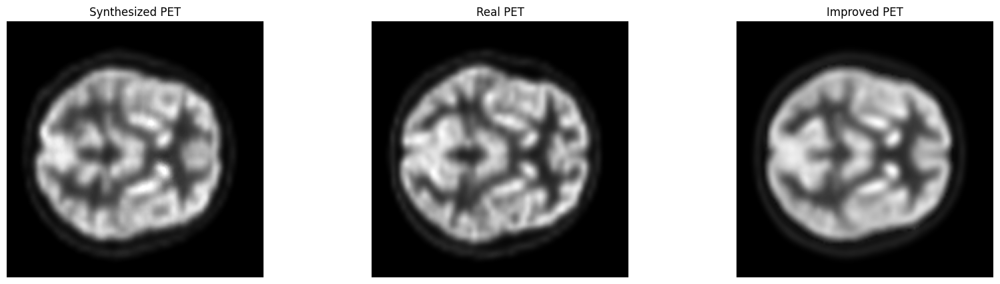

1/1 [==============================] - 0s 17ms/step


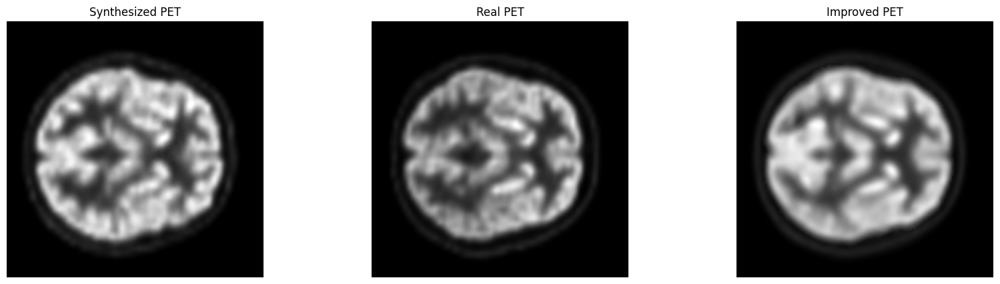

1/1 [==============================] - 0s 18ms/step


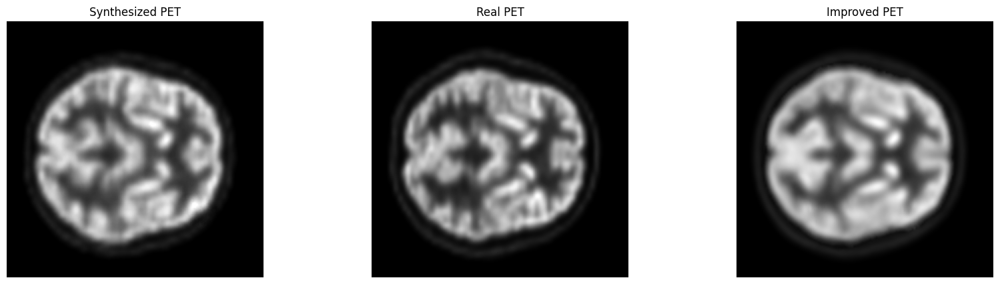

Average Mean Squared Error:  0.0048353316643359985
Average PSNR:  23.25841678272594


In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Assuming that 'file_paths_dataset_test' is your test dataset
mse_total = 0
psnr_total = 0
num_samples = 0

for input_image, target_image in file_paths_dataset_test:
    # Generate output image from the input image
    prediction = model.predict(input_image)

    input_image = np.squeeze(input_image)
    target_image = np.squeeze(target_image)
    prediction = np.squeeze(prediction)

    # Apply the same post-processing steps as in training (e.g., increase contrast and remove noise)
    increased_contrast_prediction = increase_contrast(prediction)
    denoised_prediction = remove_noise(increased_contrast_prediction)

    mse = tf.keras.losses.MeanSquaredError()
    mse_value = mse(tf.convert_to_tensor(target_image), tf.convert_to_tensor(denoised_prediction))
    mse_total += mse_value.numpy()

    max_target = tf.reduce_max(target_image)
    psnr = 20 * tf.math.log(max_target / tf.sqrt(mse_value)) / tf.math.log(10.0)
    psnr_total += psnr.numpy()


    num_samples += 1

    # Display the input image, the real target image, the original predicted image, and the post-processed predicted image
    plt.figure(figsize=(20, 5))

    plt.subplot(1, 3, 1)
    plt.title('Synthesized PET')
    plt.imshow(input_image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Real PET')
    plt.imshow(target_image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Improved PET')
    plt.imshow(denoised_prediction, cmap='gray')
    plt.axis('off')

    plt.show()

# Calculate average error metrics
mse_average = mse_total / num_samples
psnr_average = psnr_total / num_samples

print("Average Mean Squared Error: ", mse_average)
print("Average PSNR: ", psnr_average)


In [ ]:
# import tensorflow as tf
# import matplotlib.pyplot as plt

# # Define your custom loss function (replace with your actual custom loss function)
# def custom_loss(y_true, y_pred):
#     # Your custom loss logic here
#     # For example, mean squared error (MSE):
#     return tf.reduce_mean(tf.square(y_pred - y_true))

# # Load your trained U-Net-like model (replace with your actual model path)
# model_path = '/content/drive/MyDrive/trained_dcnn_slices/new_model.h5'
# trained_model = tf.keras.models.load_model(model_path, custom_objects={'custom_loss': custom_loss})

# # Print a success message
# print(f"The trained model was successfully loaded from '{model_path}' in your Google Drive")

# # Initialize error metrics
# mse_total = 0
# mae_total = 0
# num_samples = 0

# # Assuming that 'file_paths_dataset_test' is your test dataset
# for input_image, target_image in file_paths_dataset_test:
#     # Generate output image from the input image
#     prediction = trained_model.predict(input_image)

#     # Calculate the error metrics
#     mse = tf.keras.losses.MeanSquaredError()
#     mae = tf.keras.losses.MeanAbsoluteError()
#     mse_total += mse(target_image, prediction).numpy()
#     mae_total += mae(target_image, prediction).numpy()
#     num_samples += 1

#     # Display the input image, the real target image, and the predicted image
#     plt.figure(figsize=(15, 5))

#     plt.subplot(1, 3, 1)
#     plt.title('Input Image')
#     plt.imshow(input_image[0, :, :, 0], cmap='gray')
#     plt.axis('off')

#     plt.subplot(1, 3, 2)
#     plt.title('Real Target Image')
#     plt.imshow(target_image[0, :, :, 0], cmap='gray')
#     plt.axis('off')

#     plt.subplot(1, 3, 3)
#     plt.title('Predicted Image')
#     plt.imshow(prediction[0, :, :, 0], cmap='gray')
#     plt.axis('off')

#     plt.show()

# # Calculate average error metrics
# mse_average = mse_total / num_samples
# mae_average = mae_total / num_samples

# print("Average Mean Squared Error: ", mse_average)
# print("Average Mean Absolute Error: ", mae_average)


In [ ]:
model_folder = '/content/drive/MyDrive/trained_dcnn_slices/targets_tensorsofUNET_testing'
model_path = os.path.join(model_folder,"trained_UNETslice.h5")
model.save(model_path)

In [ ]:
from tensorflow.keras.models import load_model

# Specify the path to your saved model
model_path = '/content/drive/MyDrive/trained_dcnn_slices/trained_UNETslice.h5'

# Load the model
loaded_model = load_model(model_path)

In [ ]:
# Assuming you have already trained your model and compiled it
# model.compile(optimizer=optimizer, loss=custom_loss)

# Save the model weights to a file
model.save_weights('UNETweights.h5')


print("Model weights saved successfully!")


Model weights saved successfully!


In [ ]:
model = get_model()  # Replace with the actual function or class name for your U-Net model

# Load the saved weights
model.load_weights('UNETweights.h5')


NameError: name 'get_model' is not defined

In [ ]:
def display_all_weights(model):
    for layer in model.layers:
        if len(layer.get_weights()) > 0:
            print(f"Layer: {layer.name}")
            weights = layer.get_weights()[0]  # Get only the weights (ignore biases)
            print(f"Weights shape: {weights.shape}")
            print("Weights:")
            print(weights)
            print("-" * 40)

# Assuming you've already trained and compiled your model
# model.compile(optimizer=optimizer, loss=custom_loss)

# Call the function to display weights
display_all_weights(model)


In [ ]:
# # Assuming you've already trained and compiled your U-Net model
# # model.compile(optimizer=optimizer, loss=custom_loss)

# # Get the weights of the first convolutional layer
# conv1_weights = model.layers[1].get_weights()

# # Print the weights (assuming it's a Conv2D layer)
# print("Conv1 Weights Shape:", conv1_weights[0].shape)
# print("Conv1 Bias Shape:", conv1_weights[1].shape)


In [ ]:
def display_all_weights(model):
    for layer in model.layers:
        if len(layer.get_weights()) > 0:
            print(f"Layer: {layer.name}")
            weights = layer.get_weights()[0]  # Get only the weights (ignore biases)
            print(f"Weights shape: {weights.shape}")
            print("-" * 40)

# Assuming you've already trained and compiled your model
# model.compile(optimizer=optimizer, loss=custom_loss)

# Call the function to display weights
display_all_weights(model)


**TESTING PIX2PIX WITH 11 TEST IMAGES**

**-------------------------------------------------------------------------**